# <b>YOLO - Object Detection



- YOLO is a popular object detection algorithm that uses a single convolutional neural network to perform object detection and classification simultaneously.

- YOLO is known for its speed and accuracy, as it can detect objects in real-time with high accuracy.

- YOLO divides the input image into a grid and assigns each grid cell to a specific object or background class based on the presence or absence of an object within that cell.

- YOLO can detect multiple objects in a single image and provides the coordinates and class probabilities of each detected object.

- YOLO has evolved over time, with YOLOv2, YOLOv3, and YOLOv4 being some of the most popular versions, each with improvements in speed, accuracy, and feature extraction.

Now moving to version-5 of YOLO known as YOLOV5.Some of the important pointers of the version-5 can be seen as:

- YOLOv5 is a state-of-the-art object detection algorithm that uses a single neural network to predict bounding boxes and class probabilities for objects in an image.

- One of the most important points of YOLOv5 over all other previous versions of YOLO is its improved accuracy and speed. YOLOv5 introduces a new architecture that is more efficient and accurate, allowing it to achieve state-of-the-art performance on a wide range of object detection tasks. It is also faster than previous versions, with inference times of less than 50ms per image on a GPU. Additionally, YOLOv5 includes better data augmentation techniques and training procedures, which help to improve the quality of the models that are generated. Overall, these improvements make YOLOv5 a more powerful and flexible tool for object detection than previous versions of YOLO.

Note: In the above images the letter n in YOLOv5n implies nano and similarly other letter imply to small, medium, large and extra-large so they are named according to their sizes and the number of parameters they have.

You can also observe as the number of parameters in each model increases the GPU time taken to run the model also increases so this should be taken care while using the model.

Detailed structure of YOLOv5 along with image sizes can be seen below:
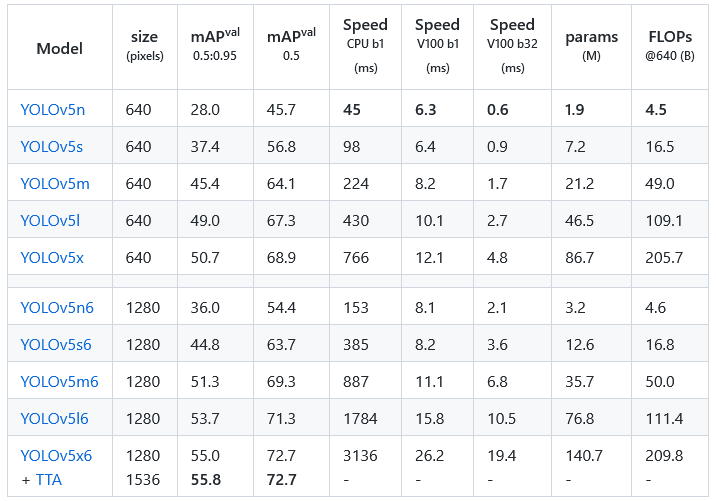

- There are 3 sets of data - train, valid and test and one more important file that is the yaml file.
- Each of train,test and valid contains two more sub-folders namely images and labels.
- The images folders contains images and the labels folders contains labels for each image

<b>Note:</b>

- The name of image and the name of the label file are absolutely the same.
- The labels folder contain a txt file for each folder as shown below
- Each text file will have 5 columns. The first column correspnds to class label and the next 4 columns denote the coordinates of the center of the box and the width and height of the boxes so these values should be multiplied with width and height of images to obtain the correct values.
- Inorder to visualize a bounding box, we can also obtain the left top coordinates and right-bottom coordinates by using the center coordinates and height and width values.
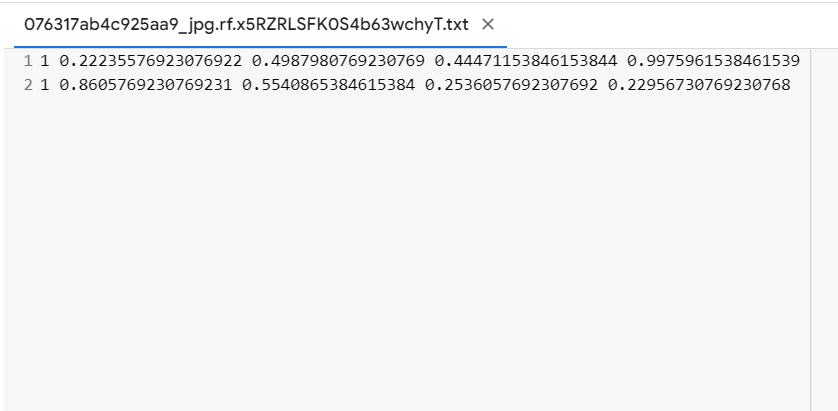


<b> Mounting Drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
# create a folder named data
! mkdir data
# Unzip dataset into the data folder
! unzip -q "/content/drive/MyDrive/Vehicles-OpenImages.zip" -d "data"


The directory structure appears as shown below:


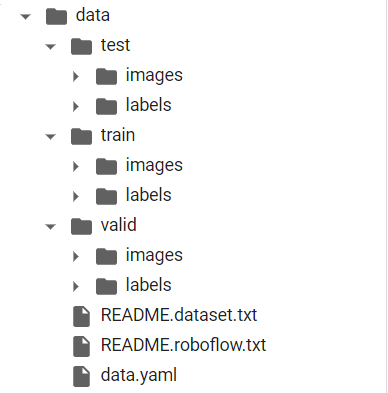

- All the images are given in the images folders and the corresponding labels are given in the labels folder. Data is available in train, test and valid folders.


<b> Importing libraries

In [ ]:
import os
import glob as glob
import matplotlib.pyplot as plt
import cv2
import requests
import random
import numpy as np

np.random.seed(42)

In [ ]:
# Define the path to the directory containing the images
path = 'data/train/images'

# Get a list of all the files in the directory
files = os.listdir(path)
files = sorted(files)

# Define the figure and axis objects using subplots
fig, ax = plt.subplots(nrows=2, ncols=4, figsize=(10, 5))

# Loop through the first 8 files in the directory
for i in range(8):
    # Load the image using Matplotlib's imread function
    img = plt.imread(os.path.join(path, files[i]))

    # Get the row and column indices for the subplot
    row = i // 4
    col = i % 4

    # Plot the image on the appropriate subplot

    ax[row, col].imshow(img)
    ax[row, col].axis('off')

# Show the plot
plt.show()


- We can observe that this dataset has same image repeated twice so we would likely delete one image from the two and also remove their corresponding labels

### Hyperparameters and Constants

Here, we define wether to train the model or not and for how many epochs to train for.

If `TRAIN = False`, then the last trained model will be used for inference in the notebook if run end to end.

In [ ]:
TRAIN = True
# Number of epochs to train for.
EPOCHS = 15

## 2. Loading and Prepare the Dataset

We will use the Vehicles-OpenImages dataset for training the custom YOLOv5 object detector.

Let's download the dataset.

In [ ]:
# Loading from the three directories -  Train, Test and Validation
dirs = ['data/train', 'data/valid', 'data/test']

# Loop through each directory
for i, dir_name in enumerate(dirs):

    # Get a sorted list of all the image names in the directory
    all_image_names = sorted(os.listdir(f"{dir_name}/images/"))

    # Loop through each image
    for j, image_name in enumerate(all_image_names):

        # Only process every second image
        if (j % 2) == 0:

            # Get the filename without the extension
            file_name = image_name.split('.jpg')[0]

            # Remove the image file and its corresponding label file
            os.remove(f"{dir_name}/images/{image_name}")
            os.remove(f"{dir_name}/labels/{file_name}.txt")


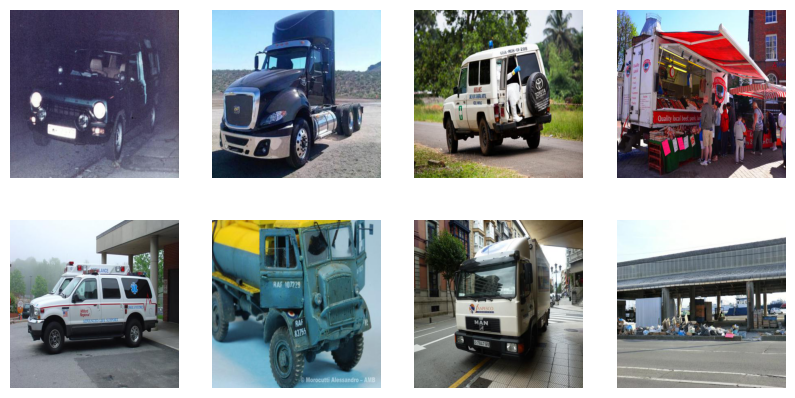

In [ ]:
# Define the path to the directory containing the images
path = 'data/train/images'

# Get a list of all the files in the directory
files = os.listdir(path)
files = sorted(files)

# Define the figure and axis objects using subplots
fig, ax = plt.subplots(nrows=2, ncols=4, figsize=(10, 5))

# Loop through the first 8 files in the directory
for i in range(8):
    # Load the image using Matplotlib's imread function
    img = plt.imread(os.path.join(path, files[i]))

    # Get the row and column indices for the subplot
    row = i // 4
    col = i % 4

    # Plot the image on the appropriate subplot
    ax[row, col].imshow(img)
    ax[row, col].axis('off')

# Show the plot
plt.show()


Now only one original image is kept and all others are removed from the data. And also their corresponding labels are removed from the data.

### data.yaml file

The `data.yaml` file usually contains the path to the training and validation images and training and validation labels. This file will also contains the number of classes and all the class names from the dataset in a list

our dataset has 5 classes:- **'Ambulance', 'Bus', 'Car', 'Motorcycle', 'Truck'**.

The default yaml file can be seen below:

```yaml
# path to train images
train: ../train/images
# path to validation images
val: ../valid/images

# nc represents number of classes
nc: 5

# names shows the names of all the classes in the dataset
names: ['Ambulance', 'Bus', 'Car', 'Motorcycle', 'Truck']
```

In [ ]:
import yaml

# Define the new paths for the train and validation images
new_train_path = '../data/train/images'
new_val_path = '../data/valid/images'

# Load the existing content of the data.yaml file
with open('/content/data/data.yaml', 'r') as f:
    data = yaml.safe_load(f)

# Modify the paths for the train and validation images
data['train'] = new_train_path
data['val'] = new_val_path

# Write the modified content back to the data.yaml file
with open('data/data.yaml', 'w') as f:
    yaml.dump(data, f)


## 3. Visualize a Few Ground Truth Images

Before moving forward, let's check out few of the ground truth images.

The current annotations in the text files are in normalized `[x_center, y_center, width, height]` format.
Write function that will convert it back to `[x_min, y_min, x_max, y_max]` format.

In [ ]:
# define a list of class names 'Ambulance', 'Bus', 'Car', 'Motorcycle', 'Truck
class_names = ['Ambulance', 'Bus', 'Car', 'Motorcycle', 'Truck']

# generate random RGB color values for each class
colors = np.random.uniform(0, 255, size=(len(class_names), 3))

In [ ]:
# Function to convert bounding boxes in YOLO format to xmin, ymin, xmax, ymax.
# This function takes in a list of bounding box coordinates in the form [x, y, width, height]
def yolo2reqbox(bboxes):
    # Compute the minimum x and y coordinates of the bounding box
    xmin = bboxes[0] - bboxes[2] / 2
    ymin = bboxes[1] - bboxes[3] / 2

    # Compute the maximum x and y coordinates of the bounding box
    xmax = bboxes[0] + bboxes[2] / 2
    ymax = bboxes[1] + bboxes[3] / 2

    # Return the coordinates of the bounding box in the form [xmin, ymin, xmax, ymax]
    return [xmin, ymin, xmax, ymax]


- This function takes in a list of bounding box coordinates in the format [x, y, width, height], which represent the center coordinates of the bounding box along with its width and height. The function then computes the minimum and maximum x and y coordinates of the bounding box using the center coordinates, width, and height. Finally, the function returns the coordinates of the bounding box in the format [xmin, ymin, xmax, ymax], where xmin and ymin represent the minimum x and y coordinates, respectively, and xmax and ymax represent the maximum x and y coordinates, respectively.

In [ ]:
# function to plot the bounding boxes
def plot_box(image, bboxes, labels):
    # Need the image height and width to denormalize
    # the bounding box coordinates
    h, w, _ = image.shape

    # Iterate over each bounding box
    for box_num, box in enumerate(bboxes):
        # Convert YOLO format bounding box coordinates to regular bounding box coordinates using yolo2reqbox function
        x1, y1, x2, y2 = yolo2reqbox(box)

        # Denormalize the coordinates by multiplying the width and height values to coordinates
        xmin = int(x1*w)
        ymin = int(y1*h)
        xmax = int(x2*w)
        ymax = int(y2*h)

        # Calculate the width and height of the bounding box
        width = xmax - xmin
        height = ymax - ymin

        # Get the class name of the object detected
        class_name = class_names[int(labels[box_num])]

        # Draw a rectangle around the detected object
        cv2.rectangle(image, (xmin, ymin), (xmax, ymax),color=colors[class_names.index(class_name)],thickness=2)

        # Calculate the font size and thickness based on the image size
        font_scale = min(1,max(3,int(w/500)))
        font_thickness = min(2, max(10,int(w/50)))

        # Create a rectangle to hold the text label of the detected object
        p1, p2 = (int(xmin), int(ymin)), (int(xmax), int(ymax))
        tw, th = cv2.getTextSize(class_name, 0, fontScale=font_scale, thickness=font_thickness)[0]

        p2 = p1[0] + tw, p1[1] + -th - 10

        cv2.rectangle(image, p1, p2,color=colors[class_names.index(class_name)],thickness=-1)

        # Add the class name to the image
        cv2.putText(image, class_name,(xmin+1, ymin-10),cv2.FONT_HERSHEY_SIMPLEX, font_scale,(255, 255, 255),font_thickness)

    # Return the image with the bounding boxes and labels drawn on it
    return image


This function takes an image, a list of bounding box coordinates, and a list of labels as inputs. It draws boxes and labels on the image for each bounding box specified in the bboxes list (the values of the YOLO boxes are given in normalized format so we need to denormalize the values before using them.
The function first extracts the height, width, and depth of the image using the shape attribute of the image numpy array. It then loops over the bounding boxes in the bboxes list and denormalizes the coordinates using the image height and width.
It extracts the class name from the list of labels and assigns it to the variable class_name. It then draws a rectangle using the OpenCV cv2.rectangle function on the image with the specified color and thickness.
Next, it calculates the font scale and font thickness based on the image width and assigns them to the variables font_scale and font_thickness respectively. It then calculates the text width and height using the cv2.getTextSize function and assigns them to the variables tw and th.

It then draws another rectangle on the image to create a background for the label using the same color as the box, but with thickness=-1 to fill the rectangle. Finally, it writes the label text using the cv2.putText function, specifying the font, font scale, color, and thickness.

The function returns the modified image with bounding boxes and labels drawn on it.

In [ ]:
# Function to plot images with the bounding boxes.
def plot(image_paths, label_paths, num_samples):
    # Get all the image and label paths using the glob library.
    all_training_images = glob.glob(image_paths)
    all_training_labels = glob.glob(label_paths)
    # Sort the paths to ensure that the images and labels are aligned correctly.
    all_training_images.sort()
    all_training_labels.sort()

    # Find the number of images in the dataset.
    num_images = len(all_training_images)

    # Set the size of the figure that will contain the plots.
    plt.figure(figsize=(15, 12))
    # Plot a random sample of images and their corresponding labels.
    for i in range(num_samples):
        # Select a random image from the dataset.
        j = random.randint(0,num_images-1)
        # Read the image using the cv2 library.
        image = cv2.imread(all_training_images[j])
        # Open the corresponding label file and read the bounding boxes and labels.
        with open(all_training_labels[j], 'r') as f:
            bboxes = []
            labels = []
            # Read each line in the label file.
            label_lines = f.readlines()
            # Extract the label and bounding box coordinates from each line.
            for label_line in label_lines:
                label = label_line[0]
                bbox_string = label_line[2:]
                x_c, y_c, w, h = bbox_string.split(' ')
                x_c = float(x_c)
                y_c = float(y_c)
                w = float(w)
                h = float(h)
                bboxes.append([x_c, y_c, w, h])
                labels.append(label)
        # Plot the image with the bounding boxes and labels overlaid.
        result_image = plot_box(image, bboxes, labels)
        plt.subplot(2, 2, i+1)
        plt.imshow(result_image[:, :, ::-1])
        plt.axis('off')
    # Adjust the spacing between the subplots and display the plot.
    plt.subplots_adjust(wspace=0)
    plt.tight_layout()
    plt.show()


## Function to store the results



In [ ]:
def store_results_dir():
    # Directory to store results

    # Count the number of existing result directories
    res_dir_count = len(glob.glob('runs/train/*'))

    # Print the current number of result directories
    print(f"Current number of result directories: {res_dir_count}")

    # If the code is being run for training
    if TRAIN:
        # Set the name of the result directory to include a count incremented by 1
        RESULTS_DIR = f"results_{res_dir_count+1}"
        print(RESULTS_DIR)
    # If the code is not being run for training
    else:
        # Set the name of the result directory to the existing count
        RESULTS_DIR = f"results_{res_dir_count}"

    # Return the name of the result directory
    return RESULTS_DIR


**TensorBoard logs**.
We would be using tensorboard to log and check our results of the model

In [ ]:
# The following code is for monitoring the TensorBoard for a specific directory
def monitor_tensorboard():
    # Load the TensorBoard extension for Jupyter notebook
    %load_ext tensorboard

    # Start the TensorBoard instance and set the log directory to 'runs/train'
    %tensorboard --logdir runs/train


### Cloning YOLOv5 Repository

YOLOv5 is released by a compnay names ultralytics so we would be cloning the same from the repository


In [ ]:
!git clone https://github.com/ultralytics/yolov5.git

Cloning into 'yolov5'...
remote: Enumerating objects: 15529, done.
remote: Counting objects: 100% (136/136), done.
remote: Compressing objects: 100% (93/93), done.
remote: Total 15529 (delta 49), reused 119 (delta 43), pack-reused 15393
Receiving objects: 100% (15529/15529), 14.59 MiB | 17.19 MiB/s, done.
Resolving deltas: 100% (10577/10577), done.


Now, we need to move into the yolov5 directory to install the requirements file and other modules as required

In [ ]:
# moving into the yolov5 directory
%cd yolov5/
!pwd

/content/yolov5
/content/yolov5


Installing the requirements file from the yolov5 repo. This will install all the required dependencies of yolov5 onto colab.

In [ ]:
!pip install -r requirements.txt

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 184.3/184.3 kB 16.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 8.7 MB/s eta 0:00:00


## Using YOLOv5 model for training

We would start with the nano model and then try to increase the complexity of the model by moving over small and medium even.

### Train a nano (yolov5n) Model

We would be training the whole YOLO5n(nano) model withoout freezing any layers.

In [ ]:
# Define a variable to store the directory for storing the results of training
RESULTS_DIR = store_results_dir()

# If TRAIN flag is True, then execute the following command using the ! syntax in Jupyter notebooks or command line
if TRAIN:
    !python train.py --data ../data/data.yaml --weights yolov5n.pt \
    --img 640 --epochs {EPOCHS} --batch-size 16 --name {RESULTS_DIR}

### Inference
In this section, we will carry out inference on unseen images and videos from the internet.

The images for inference are in the `inference_images` directory.

The videos for inference are in the `inference_videos` directory.

### Validation Predictions and Inference from it

In this section, we will check out the predictions of the validation images saved during training. Along with that, we will also check out inference of images and videos that are loaded from our drive

In [ ]:
# This file can be seen inside the yolov5 directory
# unzipping the file
!unzip -q "/content/drive/MyDrive/inference_data_yolov5.zip"

### Functions for inference and visualizations

We will visualize the validation prediction images that are saved during training. The following is the function for that.

In [ ]:
# Function to show validation predictions saved during training.
def show_valid_results(RES_DIR):
    # Lists the contents of the directory where validation predictions are saved.
    !ls runs/train/{RES_DIR}

    # Constructs the path to the directory where the validation predictions are saved.
    EXP_PATH = f"runs/train/{RES_DIR}"

    # Finds all validation prediction images in the specified directory.
    validation_pred_images = glob.glob(f"{EXP_PATH}/*_pred.jpg")

    # Prints the list of found validation prediction images.
    print(validation_pred_images)

    # Iterates through each validation prediction image and displays it.
    for pred_image in validation_pred_images:
        # Reads in the image using OpenCV.
        image = cv2.imread(pred_image)

        # Sets the size of the plot to display the image.
        plt.figure(figsize=(19, 16))

        # Displays the image using matplotlib.
        plt.imshow(image[:, :, ::-1])

        # Turns off the axis labels.
        plt.axis('off')

        # Displays the plot.
        plt.show()


The following functions are for carrying out inference on images and videos.

In [ ]:
# Helper function for inference on images.
def inference(RES_DIR, data_path):
    # Directory to store inference results.
    infer_dir_count = len(glob.glob('runs/detect/*'))
    print(f"Current number of inference detection directories: {infer_dir_count}")
    INFER_DIR = f"inference_{infer_dir_count+1}"
    print(INFER_DIR)
    # Inference on images.
    !python detect.py --weights runs/train/{RES_DIR}/weights/best.pt \
    --source {data_path} --name {INFER_DIR}
    return INFER_DIR

We may also need to visualize images in any of the directories. The following function accepts a directory path and plots all the images in them.

In [ ]:
# Define a function to visualize inference images.
def visualize(INFER_DIR):
    # Set the path for the directory containing the inference images.
    INFER_PATH = f"runs/detect/{INFER_DIR}"
    # Use glob to get a list of all .jpg files in the directory.
    infer_images = glob.glob(f"{INFER_PATH}/*.jpg")
    # Print the list of image paths.
    print(infer_images)
    # Loop through each image and display it using matplotlib.
    for pred_image in infer_images:
        # Read the image using OpenCV.
        image = cv2.imread(pred_image)
        # Create a new figure with a size of 19x16 inches.
        plt.figure(figsize=(19, 16))
        # Display the image using matplotlib, converting from BGR to RGB color space.
        plt.imshow(image[:, :, ::-1])
        # Turn off the axis labels.
        plt.axis('off')
        # Show the figure.
        plt.show()


### Inference on Images

**To carry out inference on images, we just need to provide the directory path where all the images are stored, and inference will happen on all images automatically.**

In [ ]:
# Inference on images.
IMAGE_INFER_DIR = inference(RESULTS_DIR, '/content/yolov5/inference_data_yolov5/inference_images')

Current number of inference detection directories: 0
inference_1
detect: weights=['runs/train/results_1/weights/best.pt'], source=/content/yolov5/inference_data_yolov5/inference_images, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=inference_1, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
requirements: /content/requirements.txt not found, check failed.
YOLOv5 🚀 v7.0-145-g94714fe Python-3.9.16 torch-2.0.0+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 1765930 parameters, 0 gradients, 4.1 GFLOPs
image 1/5 /content/yolov5/inference_data_yolov5/inference_images/image_1.jpg: 448x640 4 Cars, 2 Trucks, 67.7ms
image 2/5 /content/yolov5/inference_data_yolov5/inference_

### Inference on Videos

In [ ]:
inference(RESULTS_DIR, '/content/yolov5/inference_data_yolov5/inference_videos')

## 4 Train a Small (yolov5s) Model

We would be training the whole YOLO5s(small) model withoout freezing any layers.

In [ ]:
# checking the monitoring dashboard
monitor_tensorboard()

In [ ]:
# Define a variable to store the directory for storing the results of training
RESULTS_DIR = store_results_dir()

# If TRAIN flag is True, then execute the following command using the ! syntax in Jupyter notebooks or command line
if TRAIN:
    !python train.py --data ../data/data.yaml --weights yolov5s.pt \
    --img 640 --epochs {EPOCHS} --batch-size 16 --name {RESULTS_DIR}

### 4.3 Inference on Images

In [ ]:
# Inference on images.
IMAGE_INFER_DIR = inference(RESULTS_DIR, '/content/yolov5/inference_data_yolov5/inference_images')

Current number of inference detection directories: 2
inference_3
detect: weights=['runs/train/results_2/weights/best.pt'], source=/content/yolov5/inference_data_yolov5/inference_images, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=inference_3, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
requirements: /content/requirements.txt not found, check failed.
YOLOv5 🚀 v7.0-145-g94714fe Python-3.9.16 torch-2.0.0+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7023610 parameters, 0 gradients, 15.8 GFLOPs
image 1/5 /content/yolov5/inference_data_yolov5/inference_images/image_1.jpg: 448x640 2 Ambulances, 2 Buss, 3 Cars, 1 Truck, 43.7ms
image 2/5 /content/yolov5/inference_

['runs/detect/inference_3/image_5.jpg', 'runs/detect/inference_3/image_1.jpg', 'runs/detect/inference_3/image_3.jpg', 'runs/detect/inference_3/image_4.jpg', 'runs/detect/inference_3/image_2.jpg']


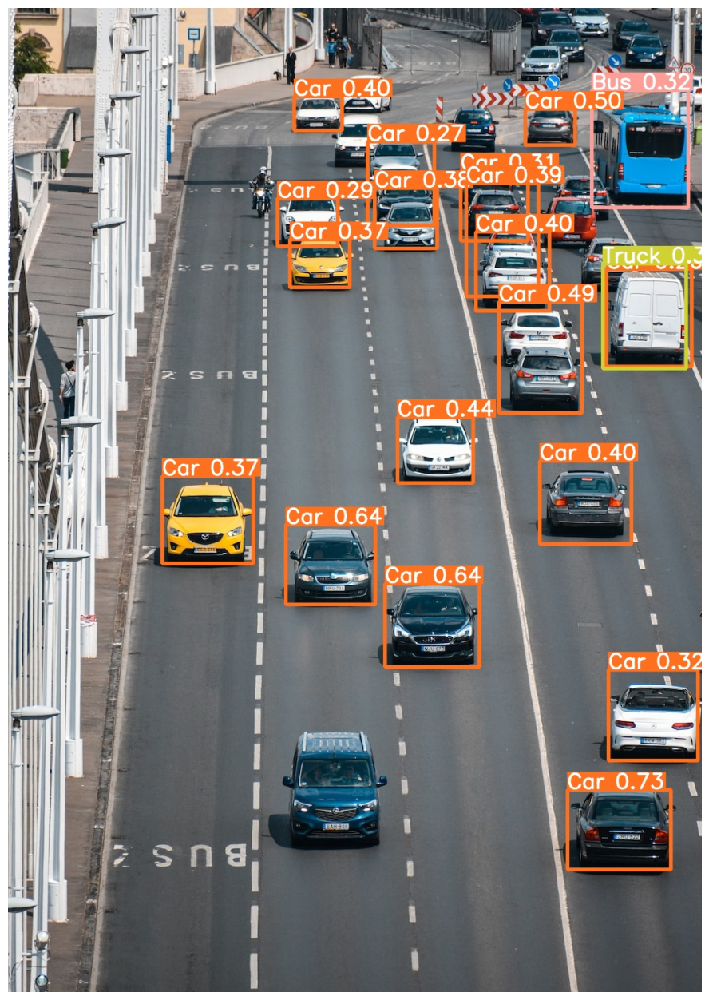

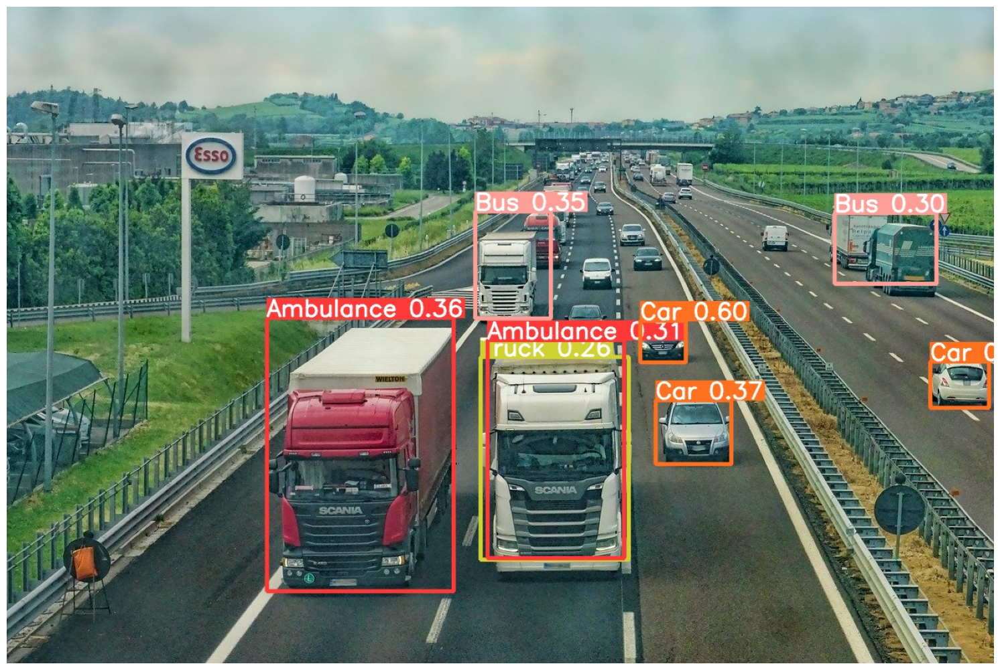

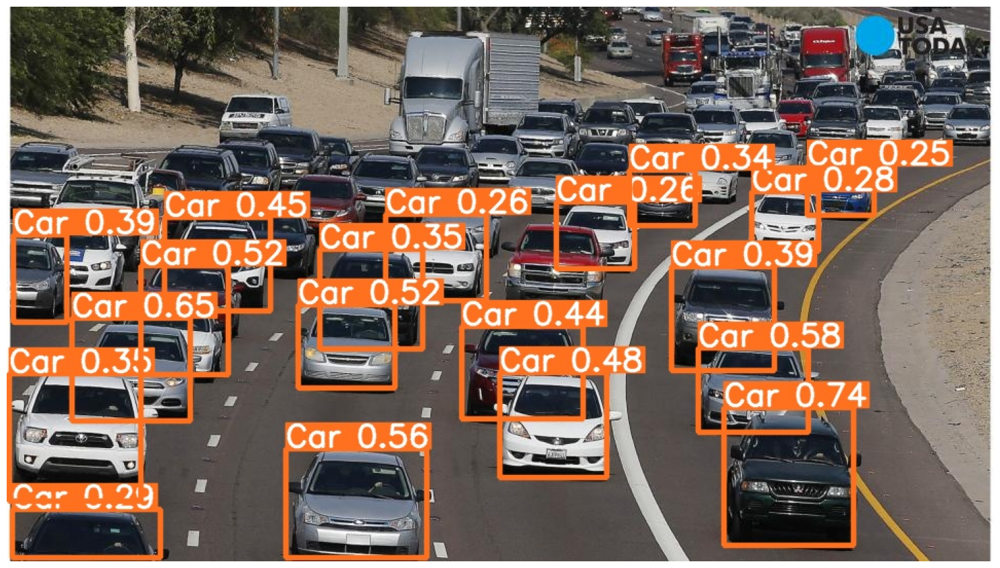

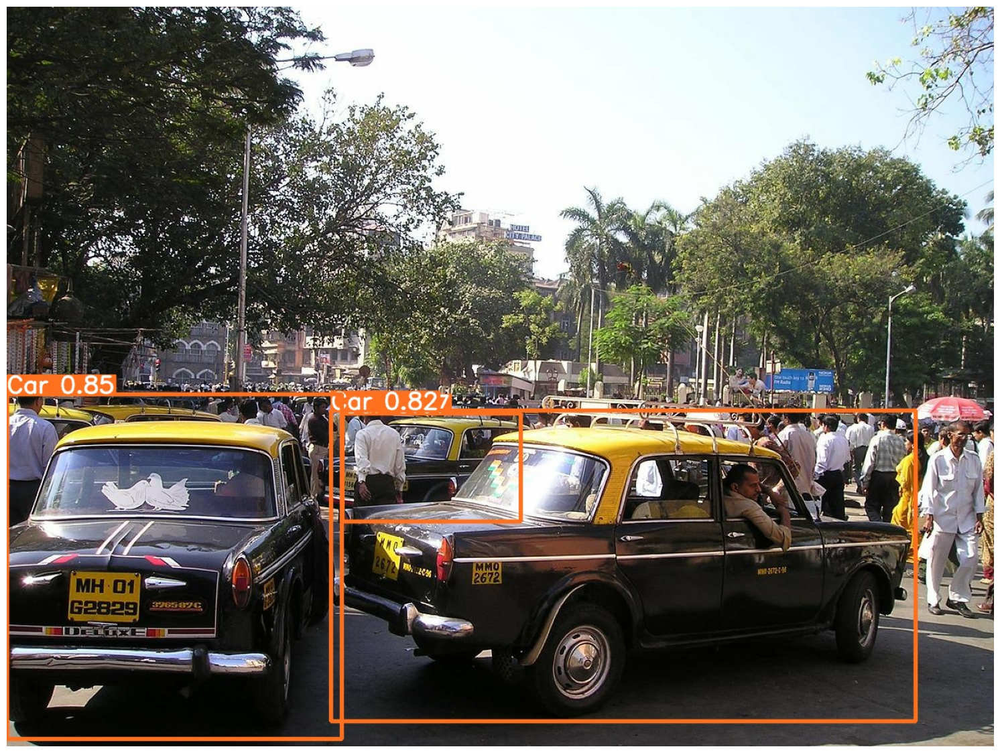

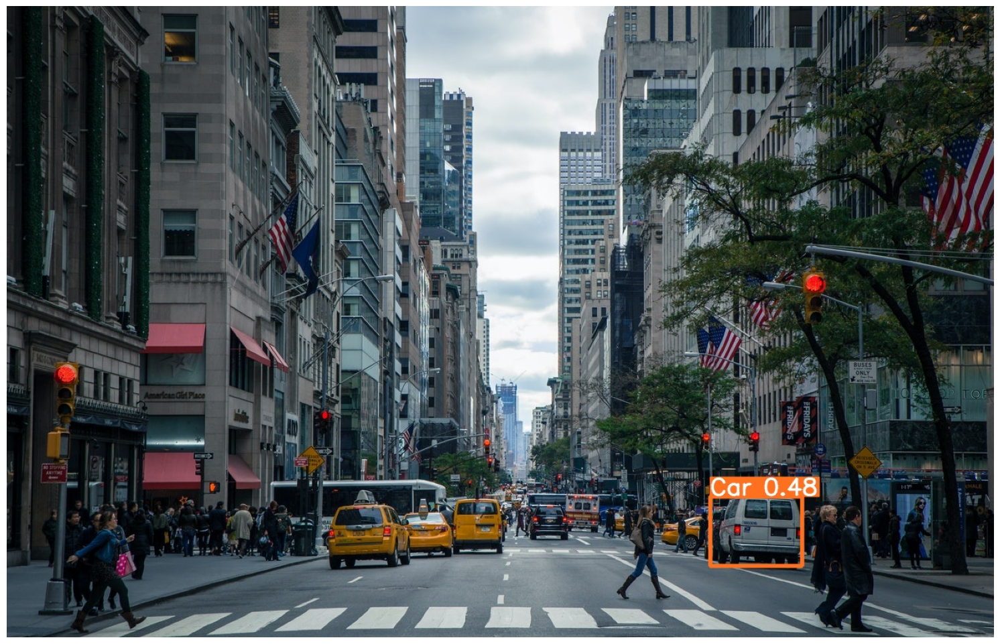

In [ ]:
# Inference on images.
visualize(IMAGE_INFER_DIR)
### Write the code to view the infernces

### 4.5 Inference on Videos

In [ ]:
inference(RESULTS_DIR, '/content/yolov5/inference_data_yolov5/inference_videos')

## 5 Training and Inference using  Medium Model

In [ ]:
monitor_tensorboard()

In [ ]:
RESULTS_DIR = store_results_dir()
if TRAIN:
    !python train.py --data ../data/data.yaml --weights yolov5m.pt \
    --img 640 --epochs {EPOCHS} --batch-size 16 --name {RESULTS_DIR}

##5.2 Inference on Images

In [ ]:
# Inference on images.
IMAGE_INFER_DIR = inference(RESULTS_DIR, '/content/yolov5/inference_data_yolov5/inference_images')

## Freezing Layers and Training the Medium Model

The Medium model (yolov5m) contains 25 blocks layers in total more than 20 million parameters. We would not likely train all the layers. So let's freeze few layers and train the model again. This would result in a faster iteration per epoch. Here, we freeze the first 15 blocks of the yolov5m model

In [ ]:
monitor_tensorboard()

In [ ]:
RES_DIR = store_results_dir()
if TRAIN:
    !python train.py --data ../data/data.yaml --weights yolov5m.pt \
    --img 640 --epochs {EPOCHS} --batch-size 16 --name {RES_DIR} \
    --freeze 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14

## 5.4 Infernce on the trained YoloV5m model

In [ ]:
# Inference on images.
IMAGE_INFER_DIR = inference(RESULTS_DIR, '/content/yolov5/inference_data_yolov5/inference_images')

In [ ]:
inference(RESULTS_DIR, '/content/yolov5/inference_data_yolov5/inference_videos')

## 6. Model Comparison

In [ ]:
monitor_tensorboard()

Ans:  

We compare models 1)yoloV5n 2). yoloV5s 3). yoloV5m and 4) yoloV5m-frozen.

According to mAP confusion matrix F1 score and all other indicators on the tensorboard  model 3) yoloV5m performed best. Second best is model 4) yoloV5m-frozen. Then model 2) then model 1).

If I wanted to improve - clearly the imlabance of the dta set would have to be addressed.

Also judging from improvements over epochs number - increasing the number of epochs could help convergence and increase F1, mAP and precision.  


Truck has the worst scores but this class is also one with the fewer training images.


Nano performs "worse"but in the photo with several yellow taxis only this model recognizes more than one car. Nano also has better recognition of "Truck" on the highway photo.

Judging from the photos Nano (yoloV5n) performed pretty well even though the scores are a bit lower.


## 7. Conclusion

Ans :

All models were relatively fast.
The models for this dataset and experiments have similar mAP as provided on the general information about yolo models.

Models have problems with "crowded" images and when there were only parts of the motorcycle.

Business applications of the YOLO can be video surveillance, self-driving cars, and augmented reality.



In [ ]:
!jupyter nbconvert --to html /content/AJaron_27s_notebook_Vehicle_Object_Detection_using_YOLOv5+_281_29.ipynb